# 1. Image Preprocessing
**입력 이미지는 227x227x3(RGB) 입니다. Input Image를 256x256로 리사이징한 후 227x227 영역을 crop**
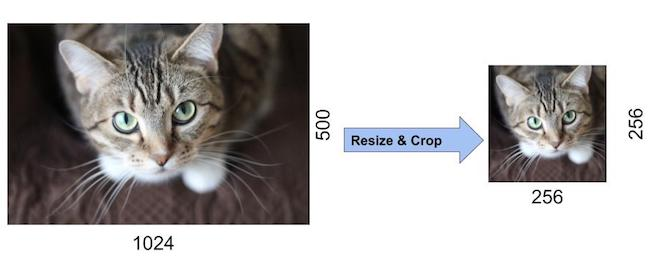

# 2. Data Augmentation
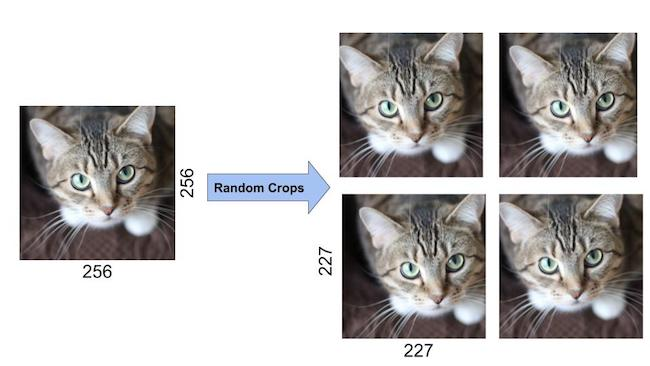
* 이미지 평행 이동 : 256x256 입력 이미지서 무작위로 227x227 영역을 잘라내어 데이터 수를 1024배 증가
* 수평 반전 : 이미지를 수평으로 반전시켜 데이터 수를 2배로 늘림.
* 조명 변화 : PCA 기법을 활용해 각 이미지의 픽셀 강도를 부드럽게 변형시켰습니다.
    * PCA 기반 색상 노이즈 추가는 이미지의 색상 공간에서 노이즈를 추가하여 데이터 증강을 수행

# 3. AlexNet Architecture

**AlexNet은 5개의 합성곱 계층과 3개의 완전연결 계층으로 구성된 8계층 CNN 모델입니다. 본 논문에서는 GPU를 활용한 병렬 학습을 위해 동일한 모양의 구조가 2가지로 나눠져 있었습니다. 아래 그림과 논문에는 224x224x3 크기가 언급되어있지만, 이후 수정되어 1계층으로 패딩을 통해 227x227x3 사이즈로 변경되었습니다.**

-> GPU 메모리 용량이 제한적이었기 때문


### 3.1 수정 전 병렬 학습을 위한 AlexNet
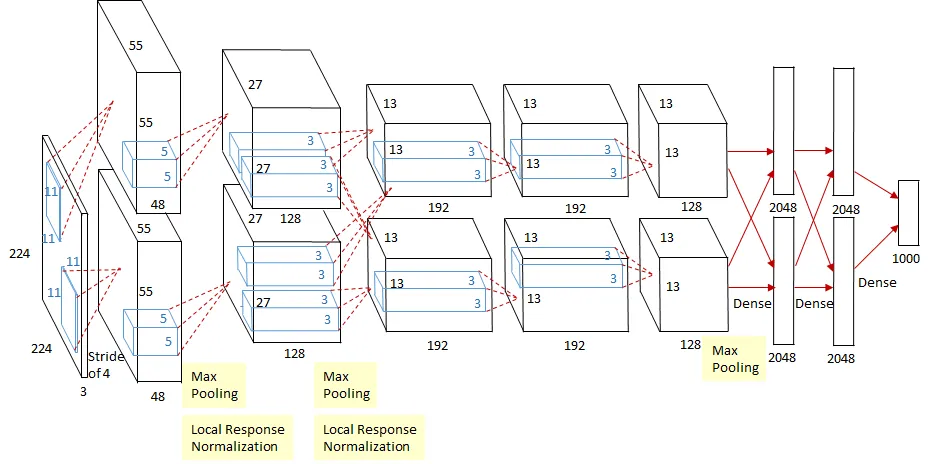
<br>
<br>
### 3.2 이후 GPU 메모리 용량의 증가에 따라 수정된 AlexNet
* <span style="color: #2D3748; background-color:#fff5b1;"> Overlapping Max Pooling</span> : 보통 이때는 Pooling 할 때 겹치지 않게 했는데 겹치게 Pooling 하는 것을 의미
* <span style="color: #2D3748; background-color:#fff5b1;">Local Response Normalization</span> : 뉴런의 활성화 값을 정규화하여 모델의 일반화 성능을 향상시키는 기법입니다. (자세한 설명은 Batch Normalization 설명할 때 같이 진행하겠습니다.)
* <span style="color: #2D3748; background-color:#fff5b1;">Fully Connected Layer</span> : 마지막 Convolutional Layer 끝나면 6x6x256 Kernel이 만들어지고 Flatten하면 9216개의 노드가 만들어 지고 그 다음 Fully Connected Layer의 노드가 4096개 인 것은 한 노드 당 9216개의 가중치를 갖는 것을 의미
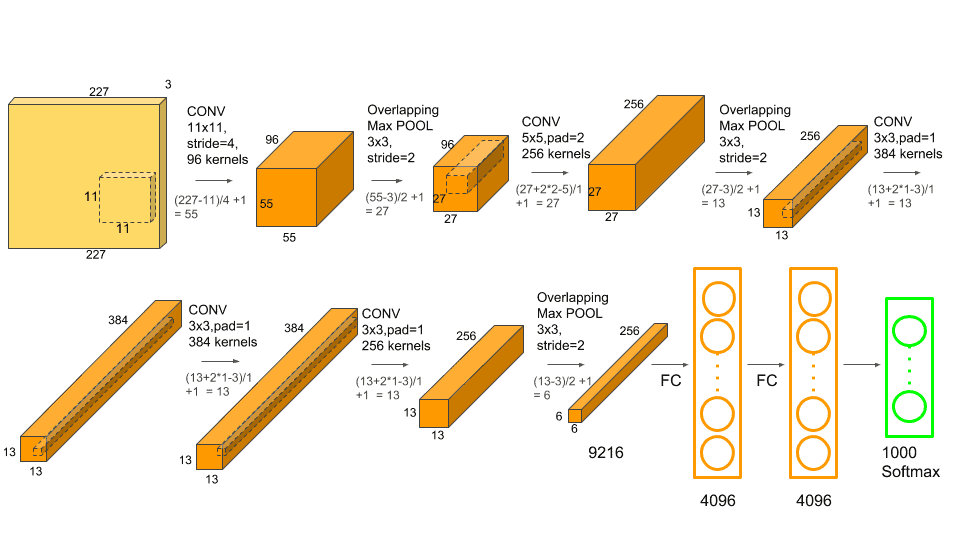


* 합성곱 계층 1
    * 11x11x3 크기의 커널 48개를 2개 그룹 사용하여, 55x55x(48×2) 특징맵 출력 (stride=4, padding=0)
    * 3×3 중첩 최대풀링 <span style="color: #2D3748; background-color:#fff5b1;"> Overlapping Max Pooling</span> 을 적용하여, 27x27x(48×2) 특징맵 출력 (stride=2)
    * 지역 응답 정규화 <span style="color: #2D3748; background-color:#fff5b1;">Local Response Normalization</span> 를 적용하고, 27x27x(48×2) 특징맵을 출력



* 합성곱 계층 2
    * 5x5x48 크기의 커널 128개를 2개 그룹 사용하여, 27x27x(128×2) 특징맵 출력 (stride=1, padding=2)
    * 3×3 중첩 최대풀링 적용하여, 13x13x128x2 특징맵 출력 (stride=2)
    * 지역 응답 정규화를 적용하고, 13x13x128x2 특징맵 출력



* 합성곱 계층 3
    * 3x3x256 크기의 커널 192개를 2개 그룹 사용하여, 13x13x192x2 특징맵 출력 (stride=1, padding=1)



* 합성곱 계층 4
    * 3x3x192 크기의 커널 192개를 2개 그룹 사용하여, 13x13x192x2 특징맵 출력 (stride=1, padding=1)



* 합성곱 계층 5
    * 3x3x192 크기의 커널 128개를 2개 그룹 사용하여, 13x13x128x2 특징맵 출력 (stride=1, padding=1)
    * 3×3 중첩 최대풀링(stride=2)을 적용하여, 6x6x128x2 특징맵 출력



* <span style="color: #2D3748; background-color:#fff5b1;">완전연결 계층</span> 6-8
    * 5계층 합성곱 후 6계층, 7계층에서는 각각 4096개의 노드가 있습니다.
    * 마지막 8계층에는 1000개의 노드가 있어 1000개 클래스 구분을 의미하는 확률값을 출력합니다.



* 파라미터 수와 계산 복잡도
    * AlexNet에는 약 6천만 개의 학습 가능한 파라미터가 있습니다. 당시 GPU 환경에서 5~6일(!!)이 걸렸던 대규모 모델입니다.

##### 3.2.1 출력 Feature Map 크기 계산 공식
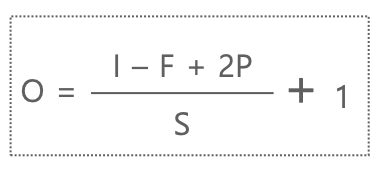
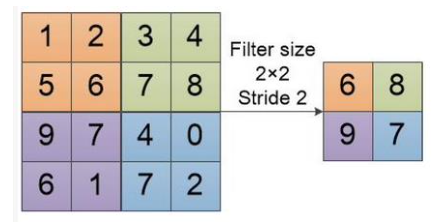
* I : 입력 Feature Map의 크기
* F : Filter의 크기(Kernel size) : 4x4
* P : Padding(정수) : 모서리 채우는 것, 1이면 4x4 → 5x5
* S : Strides(정수) : 몇단위로 이동하나

##### 3.2.2 다차원 합성곱
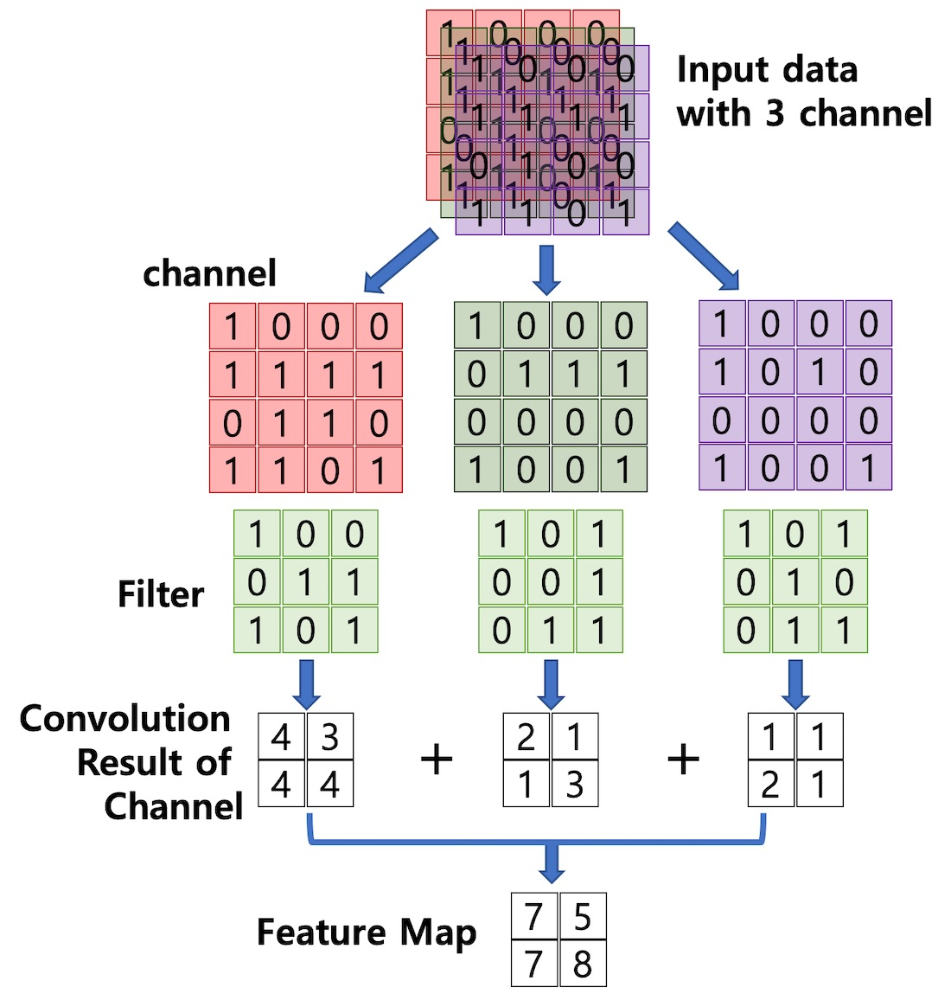

# 4. ReLU(Rectified Linear Unit) Activation Function
* **이전 신경망에서는 tanh를 보통 사용하였으니 새로운 Activation Function인 ReLU 제시**
* **f(x) = max(0,x) : 음수면 0을 반환 양수면 자기 자신을 반환**
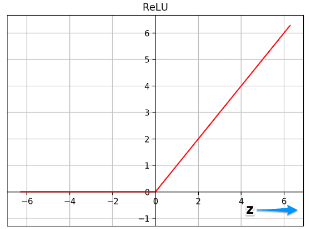

    
    
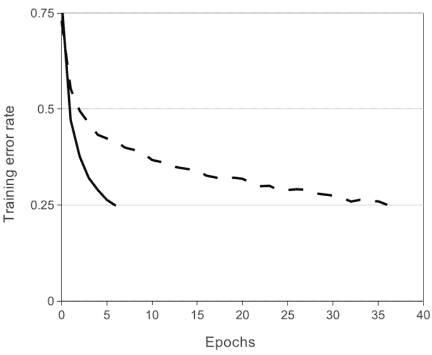
**ReLU를 사용하면 기존 활성화 함수보다 6배 더 빨리 수렴할 수 있었습니다. 이는 기존 함수들이 포화 영역에서 미분값이 0에 가까워져 학습이 느려지는 Gradient Vanishing 문제를 해결해주기 때문입니다.**

# 5. Dropout
**신경망의 과적합을 방지하기 위한 regularization 기술입니다. 각 iteration 마다 은닉층의 일부 노드를 무작위로 꺼서 과적합을 방지합니다. AlexNet에서는 완전연결 계층에 0.5 확률의 dropout을 적용했습니다.**
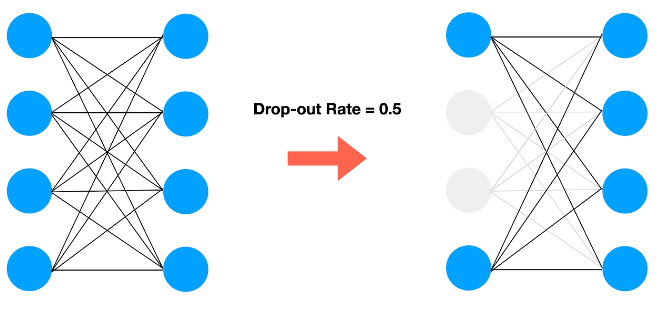

# 6. 요약
* ReLU Activation Function을 도입하여 수렴 속도 향상 (LRN을 통한 뉴런들의 활성화 정도 정규화)
* 데이터 증강으로 과적합 문제 해결
* Dropout 기법을 통한 regularization
* Local Response Nomalization, Overlapping Max Pooling으로 학습 성능 개선
* 다중 GPU 병렬 처리 기법 활용

# Reference
* https://bestkcs1234.tistory.com/52 -> 한국어 번역
* https://89douner.tistory.com/60 -> 논문 하나하나 쪼개서 해석
* https://modulabs.co.kr/blog/alexnet_structure/ -> AlexNet 구조 상세 설명
* https://proceedings.neurips.cc/paper_files/paper/2012/file/c399862d3b9d6b76c8436e924a68c45b-Paper.pdf -> 원본 논문 링크

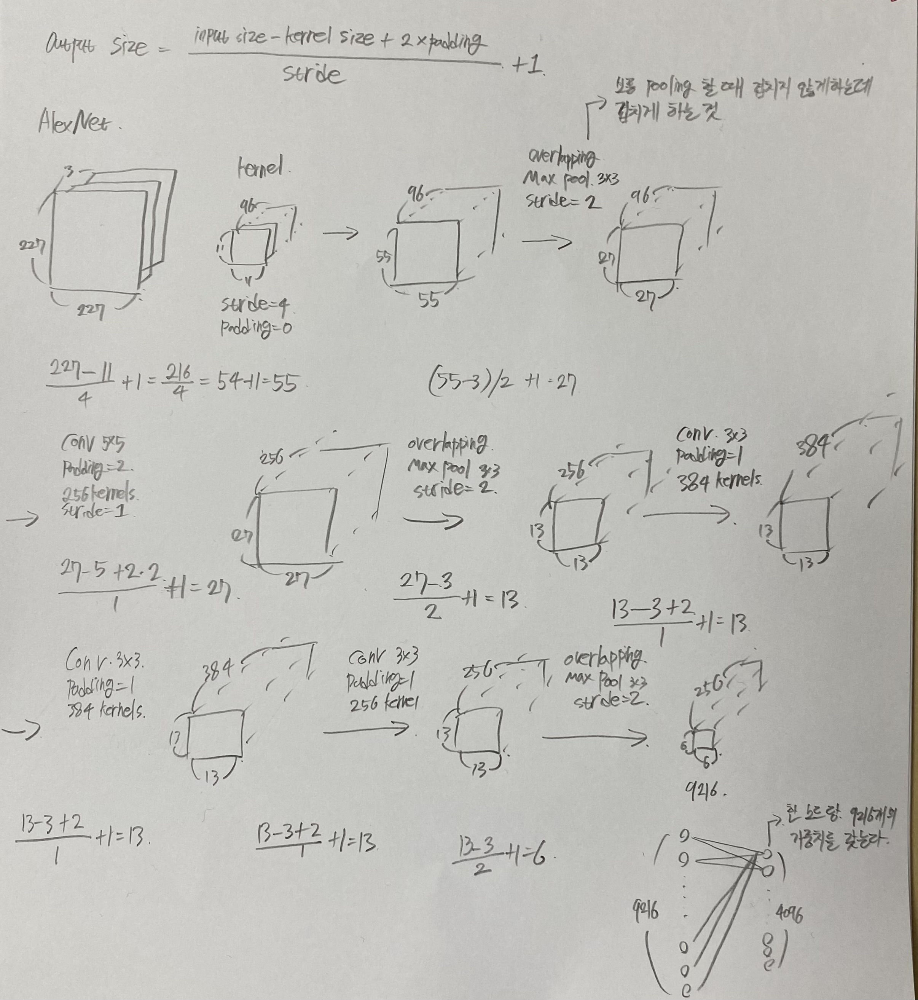